In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import hdbscan
import networkx as nx

In [2]:
df = pd.read_csv("data/food_crises_cleaned.csv") # Read data into DataFrame
df["date"] = pd.to_datetime(df["year_month"], format="%Y_%m") # Create date column

In [3]:
df_loc = df[['district', 'centx', 'centy']].drop_duplicates(subset=['centx', 'centy'])

def haversine_distance(lat1, lon1, lat2, lon2):
    R = 6371  # Radius of the Earth in kilometers
    dlat = np.radians(lat2 - lat1)
    dlon = np.radians(lon2 - lon1)
    a = np.sin(dlat/2) * np.sin(dlat/2) + np.cos(np.radians(lat1)) * np.cos(np.radians(lat2)) * np.sin(dlon/2) * np.sin(dlon/2)
    c = 2 * np.arctan2(np.sqrt(a), np.sqrt(1-a))
    distance = R * c
    return distance


data = df_loc[['centx', 'centy']].values

# Create a distance matrix using haversine distance
distance_matrix = np.array([[haversine_distance(data[i, 1], data[i, 0], data[j, 1], data[j, 0]) 
                            for j in range(len(data))] for i in range(len(data))])

# Apply HDBSCAN clustering with precomputed distance
clusterer = hdbscan.HDBSCAN(metric='precomputed', min_cluster_size=4, min_samples=2) 
# Adjust min_cluster_size based on your requirements
labels = clusterer.fit_predict(distance_matrix)

df_loc['cluster_labels'] = labels

In [4]:
label_1 = df_loc[df_loc['cluster_labels']==1]['district'].unique()
df_label_1 = df[df['district'].isin(label_1)]
df_label_1

,country,district_code,district,centx,centy,year_month,year,month,ipc,ha,...,et_anom,count_violence,sum_fatalities,food_price_idx,area,cropland_pct,pop,ruggedness_mean,pasture_pct,date
474,South Sudan,77,Morobo,30.83354,3.737241,2007_01,2007,1,1.0,NaN,...,1.294314,0,0,0.675463,1350.326,11.32510,112702.3,129546.20,58.31250,2007-01-01
475,South Sudan,77,Morobo,30.83354,3.737241,2007_02,2007,2,1.0,NaN,...,-1.331599,0,0,0.660305,1350.326,11.32510,112702.3,129546.20,58.31250,2007-02-01
476,South Sudan,77,Morobo,30.83354,3.737241,2007_03,2007,3,1.0,NaN,...,-6.159248,0,0,0.666121,1350.326,11.32510,112702.3,129546.20,58.31250,2007-03-01
477,South Sudan,77,Morobo,30.83354,3.737241,2007_04,2007,4,1.0,NaN,...,-5.793944,0,0,0.684213,1350.326,11.32510,112702.3,129546.20,58.31250,2007-04-01
478,South Sudan,77,Morobo,30.83354,3.737241,2007_05,2007,5,1.0,NaN,...,-1.857522,0,0,0.672899,1350.326,11.32510,112702.3,129546.20,58.31250,2007-05-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3313,South Sudan,94,Lafon,32.67142,5.249238,2019_10,2019,10,3.0,0.0,...,8.139377,0,0,68.704290,16314.180,38.10764,222558.0,17908.12,82.58201,2019-10-01
3314,South Sudan,94,Lafon,32.67142,5.249238,2019_11,2019,11,3.0,NaN,...,9.530406,0,0,83.163410,16314.180,38.10764,222558.0,17908.12,82.58201,2019-11-01
3315,South Sudan,94,Lafon,32.67142,5.249238,2019_12,2019,12,3.0,NaN,...,11.904390,0,0,92.701400,16314.180,38.10764,222558.0,17908.12,82.58201,2019-12-01
3316,South Sudan,94,Lafon,32.67142,5.249238,2020_01,2020,1,3.0,NaN,...,9.651878,2,2,83.188330,16314.180,38.10764,614892.1,17908.12,82.58201,2020-01-01


In [5]:
df_weather_group = df_label_1.groupby(['district', 'month'])[['ndvi_mean', 'rain_mean', 'et_mean']].median().reset_index()
df_weather_group

,district,month,ndvi_mean,rain_mean,et_mean
0,Budi,1,0.368628,0.902837,4.489940
1,Budi,2,0.303741,2.135738,3.463268
2,Budi,3,0.339420,9.123751,5.932488
3,Budi,4,0.468005,13.305390,11.055180
4,Budi,5,0.575033,17.074530,16.689400
...,...,...,...,...,...
139,Yei,8,0.785015,29.450570,34.747930
140,Yei,9,0.771045,28.266410,34.745490
141,Yei,10,0.725832,32.135140,31.640170
142,Yei,11,0.695381,12.291300,25.622620


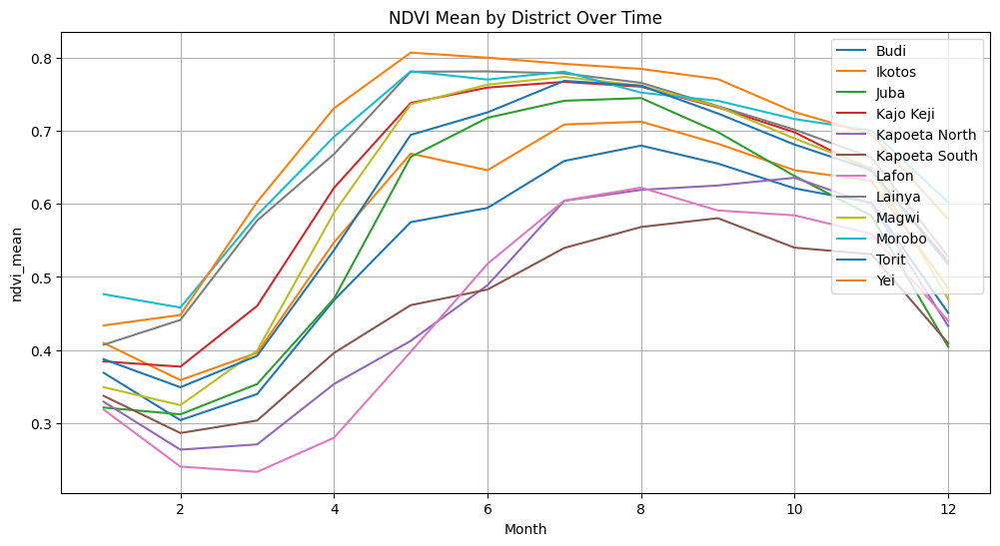

In [6]:
# Pivot the DataFrame to have 'district' as columns
df_pivot = df_weather_group.pivot(index='month', columns='district', values='ndvi_mean')

# Plot the data
plt.figure(figsize=(12, 6))
for column in df_pivot.columns:
    plt.plot(df_pivot.index, df_pivot[column], label=column)

plt.xlabel('Month')
plt.ylabel('ndvi_mean')
plt.title('NDVI Mean by District Over Time')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

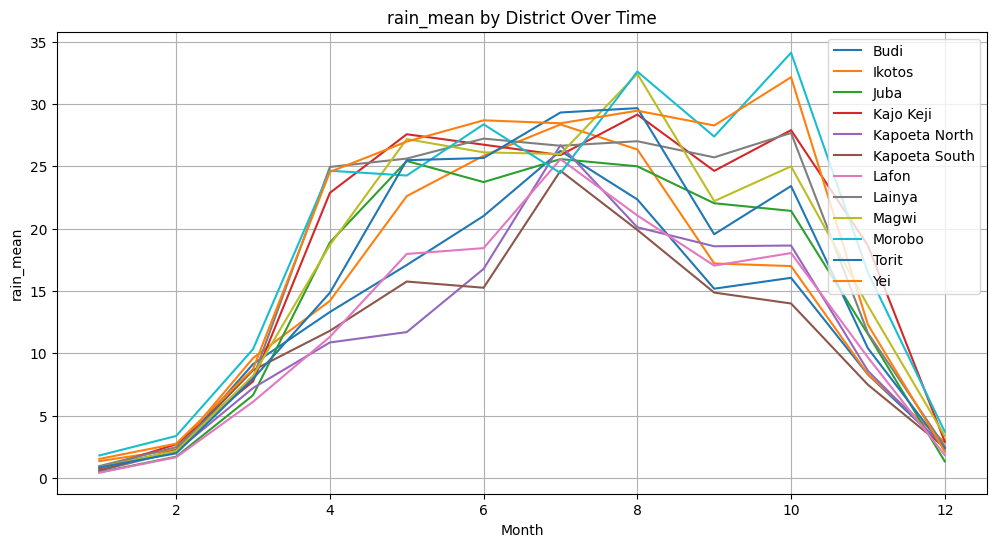

In [7]:
# Pivot the DataFrame to have 'district' as columns
df_pivot = df_weather_group.pivot(index='month', columns='district', values='rain_mean')

# Plot the data
plt.figure(figsize=(12, 6))
for column in df_pivot.columns:
    plt.plot(df_pivot.index, df_pivot[column], label=column)

plt.xlabel('Month')
plt.ylabel('rain_mean')
plt.title('rain_mean by District Over Time')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

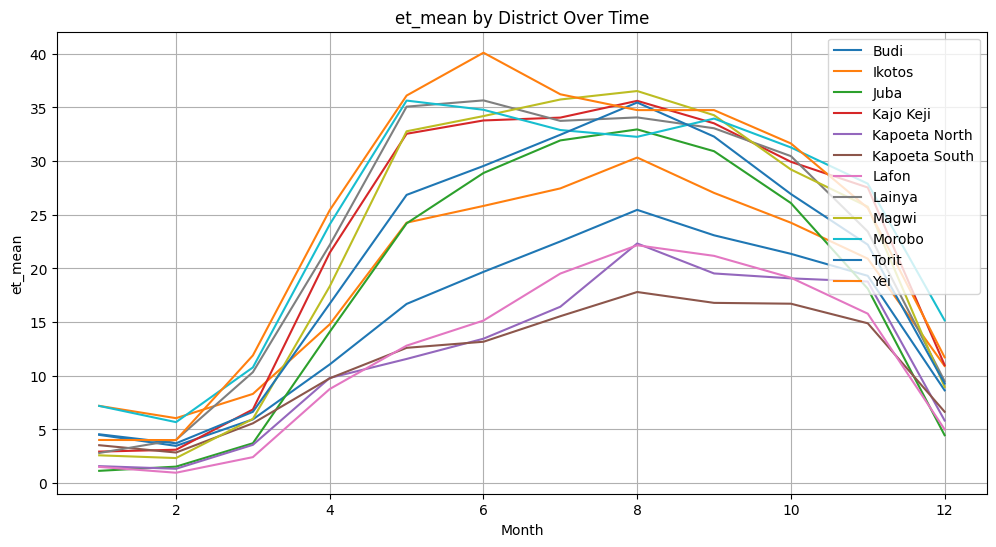

In [8]:
# Pivot the DataFrame to have 'district' as columns
df_pivot = df_weather_group.pivot(index='month', columns='district', values='et_mean')

# Plot the data
plt.figure(figsize=(12, 6))
for column in df_pivot.columns:
    plt.plot(df_pivot.index, df_pivot[column], label=column)

plt.xlabel('Month')
plt.ylabel('et_mean')
plt.title('et_mean by District Over Time')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

In [9]:
df_pivot

district,Budi,Ikotos,Juba,Kajo Keji,Kapoeta North,Kapoeta South,Lafon,Lainya,Magwi,Morobo,Torit,Yei
month,,,,,,,,,,,,
1,4.489940,7.191154,1.138616,2.931444,1.576624,3.526900,1.505223,2.802817,2.583546,7.187437,4.545336,4.015203
2,3.463268,6.046275,1.531580,3.105312,1.331038,2.844608,0.963277,4.024032,2.329673,5.676073,3.704473,4.005027
3,5.932488,8.306249,3.710406,6.858115,3.561120,5.566393,2.415668,10.334020,5.981208,10.776080,6.638384,11.893290
4,11.055180,14.793500,14.093250,21.462000,9.793743,9.761576,8.763452,22.185900,18.331910,24.098550,16.714970,25.424920
5,16.689400,24.261170,24.195400,32.542560,11.564150,12.599480,12.802920,35.069530,32.773830,35.634950,26.848590,36.103120
6,19.676640,25.818910,28.886950,33.783600,13.450620,13.166140,15.139670,35.652330,34.190740,34.778010,29.541830,40.093600
7,22.510730,27.453320,31.924760,34.048750,16.428450,15.545710,19.519490,33.743590,35.735590,32.891300,32.449950,36.221120
8,25.453520,30.328060,32.949460,35.610780,22.321980,17.799470,22.154790,34.066920,36.524440,32.257910,35.455450,34.747930
9,23.082630,27.032280,30.917030,33.515330,19.528330,16.788460,21.167880,33.056330,34.270030,33.958750,32.279830,34.745490


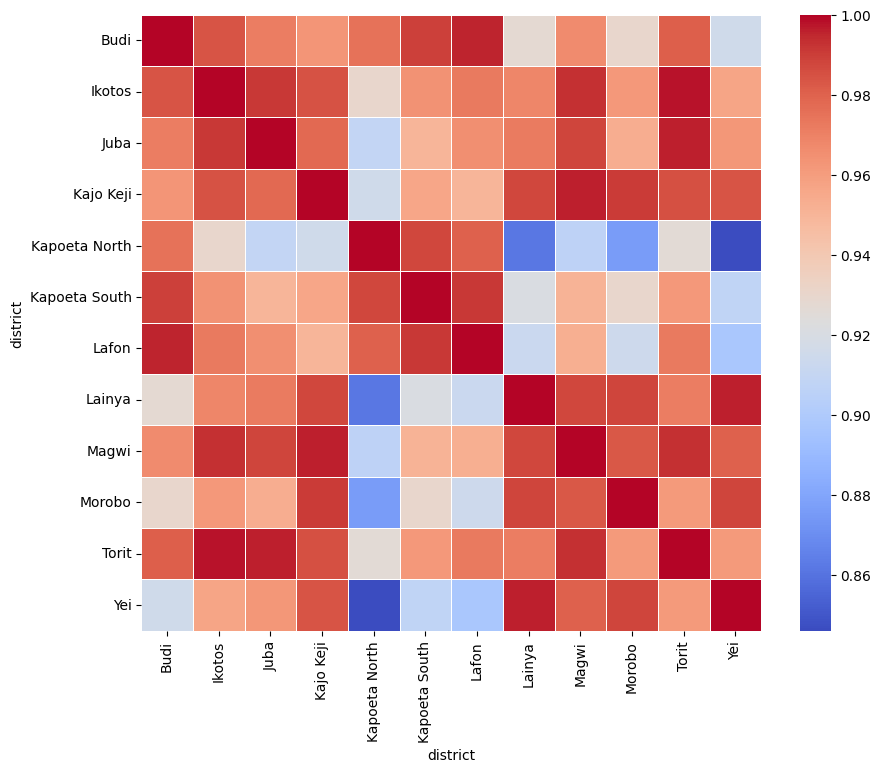

In [10]:
correlation_matrix = df_pivot.corr()
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.show()

In [11]:
# Set a threshold for correlation and for the absolute difference in correlation
correlation_threshold = 0.95
diff_threshold = 2

# Find pairs with correlation higher than the threshold and are not the same district
high_corr_pairs = set()  # Use a set to avoid duplicate pairs

# Iterate through the correlation matrix
for i in range(len(correlation_matrix.columns)):
    for j in range(i + 1, len(correlation_matrix.columns)):
        district1 = correlation_matrix.columns[i]
        district2 = correlation_matrix.columns[j]
        correlation = correlation_matrix.iloc[i, j]
        
        if correlation > correlation_threshold and district1 != district2:
            # Compute the absolute difference between the two columns
            mean_abs_difference = abs(df_pivot[district1] - df_pivot[district2]).median()
            
            if mean_abs_difference <= diff_threshold:
                # Ensure that the order of districts in the pair doesn't matter
                pair = (min(district1, district2), max(district1, district2), correlation, mean_abs_difference)
                high_corr_pairs.add(pair)

# Display the pairs with correlation higher than the threshold and small absolute difference
for pair in high_corr_pairs:
    print(f"Districts {pair[0]} and {pair[1]} have a corr of {pair[2]:.2f} and mean diff of {pair[3]:.2f}")

Districts Lainya and Morobo have a corr of 0.99 and mean diff of 1.28
Districts Kapoeta North and Kapoeta South have a corr of 0.99 and mean diff of 1.73
Districts Morobo and Yei have a corr of 0.99 and mean diff of 1.97
Districts Kajo Keji and Torit have a corr of 0.99 and mean diff of 1.66
Districts Magwi and Torit have a corr of 0.99 and mean diff of 1.98
Districts Kapoeta North and Lafon have a corr of 0.98 and mean diff of 1.09
Districts Kapoeta South and Lafon have a corr of 0.99 and mean diff of 2.00
Districts Lainya and Yei have a corr of 1.00 and mean diff of 1.62
Districts Lainya and Magwi have a corr of 0.99 and mean diff of 1.84
Districts Kajo Keji and Magwi have a corr of 1.00 and mean diff of 0.83
Districts Lainya and Torit have a corr of 0.97 and mean diff of 1.57
Districts Kajo Keji and Yei have a corr of 0.98 and mean diff of 1.81
Districts Kajo Keji and Lainya have a corr of 0.99 and mean diff of 1.21


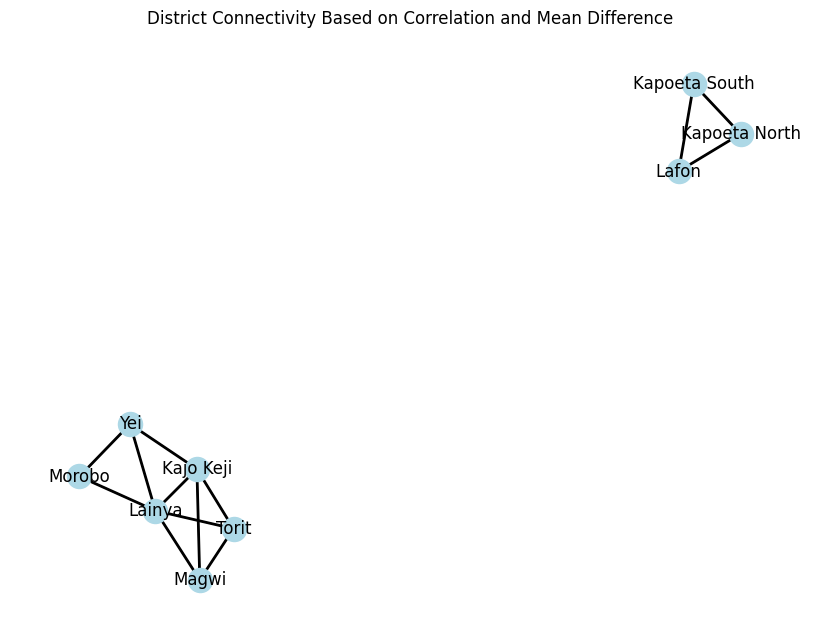

In [12]:
# Create an empty graph
G = nx.Graph()

# Iterate through the high correlation pairs and add nodes and edges to the graph
for pair in high_corr_pairs:
    district1, district2, correlation, mean_abs_difference = pair
    G.add_node(district1)
    G.add_node(district2)
    G.add_edge(district1, district2, corr=correlation, diff=mean_abs_difference)

# Define positions for nodes (optional)
pos = nx.spring_layout(G)
node_labels = {node: f"{node}" for node in G.edges()}
# Customize the plot
plt.figure(figsize=(8, 6))  # Adjust the figure size as needed

nx.draw(G, pos,with_labels=True, node_size=300, node_color='lightblue')
nx.draw_networkx_edges(G, pos, width=2.0, edge_color='black')

# Customize the plot if needed
plt.title("District Connectivity Based on Correlation and Mean Difference")

# Show the plot
plt.show()

In [13]:
# Find nodes in each connected component
connected_components = list(nx.connected_components(G))
connected_components

[{'Kajo Keji', 'Lainya', 'Magwi', 'Morobo', 'Torit', 'Yei'},
 {'Kapoeta North', 'Kapoeta South', 'Lafon'}]

In [14]:
def grouping(correlation_threshold,diff_threshold, column):
    connected_components_list = []
    for label in [0,1]:
        label_group = df_loc[df_loc['cluster_labels']==label]['district'].unique()
        df_label = df[df['district'].isin(label_group)]
        df_weather_group = df_label.groupby(['district', 'month'])[['ndvi_mean', 'rain_mean', 'et_mean']].median().reset_index()
        df_pivot = df_weather_group.pivot(index='month', columns='district', values=column)

        correlation_matrix = df_pivot.corr()
        high_corr_pairs = set() 
        # Iterate through the correlation matrix
        for i in range(len(correlation_matrix.columns)):
            for j in range(i + 1, len(correlation_matrix.columns)):
                district1 = correlation_matrix.columns[i]
                district2 = correlation_matrix.columns[j]
                correlation = correlation_matrix.iloc[i, j]
                
                if correlation > correlation_threshold and district1 != district2:
                    # Compute the absolute difference between the two columns
                    mean_abs_difference = abs(df_pivot[district1] - df_pivot[district2]).median()
                    
                    if mean_abs_difference <= diff_threshold:
                        # Ensure that the order of districts in the pair doesn't matter
                        pair = (min(district1, district2), max(district1, district2), correlation, mean_abs_difference)
                        high_corr_pairs.add(pair)

        G = nx.Graph()

        # Iterate through the high correlation pairs and add nodes and edges to the graph
        for pair in high_corr_pairs:
            district1, district2, correlation, mean_abs_difference = pair
            G.add_node(district1)
            G.add_node(district2)
            G.add_edge(district1, district2, corr=correlation, diff=mean_abs_difference)

        # Find connected components
        connected_components = list(nx.connected_components(G))
        connected_components_list.append(connected_components)
        print(f'label_{label} {column}:\n{connected_components}\n')  
    return  connected_components_list

In [15]:
connected_components_list = grouping(0.9,0.02, 'ndvi_mean')


# Create a dictionary to map each district to its group number
district_to_group = {}
data = {'district': [], 'ndvi_mean_group': []}
label = 0
for index in [0,1]:
    for _, component in enumerate(connected_components_list[index]):
        for district in component:
            district_to_group[district] = label
        label += 1

    # Create a DataFrame
    for district, group in district_to_group.items():
        data['district'].append(district)
        data['ndvi_mean_group'].append(group)
df_tmp = pd.DataFrame(data)
df_loc = df_loc.merge(df_tmp, on=['district'], how='left').drop_duplicates()
df_loc['ndvi_mean_group'] = df_loc['ndvi_mean_group'].fillna(-1)
df_loc['ndvi_mean_group'] = df_loc['ndvi_mean_group'].astype(int)
df_loc


label_0 ndvi_mean:
[{'Cueibet', 'Tonj South', 'Tonj East', 'Akobo', 'Twic', 'Malakal', 'Tonj North', 'Koch', 'Jur River', 'Pariang', 'Mayom', 'Longchuk', 'Terekeka', 'Mayendit', 'Aweil Center', 'Bor', 'Aweil West', 'Awerial', 'Gogrial West', 'Rumbek East', 'Fashoda', 'Maban', 'Panyikang', 'Yirol West', 'Rumbek Center', 'Gogrial East', 'Rumbek North', 'Melut', 'Nyirol', 'Aweil South', 'Yirol East', 'Abiemnhom', 'Aweil East', 'Rubkona', 'Guit', 'Baliet', 'Aweil North'}, {'Anzara', 'Ezo', 'Ibba', 'Maridi', 'Yambio'}, {'Mundri East', 'Mvolo', 'Wulu', 'Nagero', 'Wau'}, {'Twic East', 'Panyijiar', 'Duk', 'Ayod', 'Fangak'}, {'Tambura', 'Mundri West'}]

label_1 ndvi_mean:
[{'Morobo', 'Lainya'}, {'Magwi', 'Torit', 'Kajo Keji'}]



,district,centx,centy,cluster_labels,ndvi_mean_group
0,Bor,32.00486,6.465644,0,0
2,Jur River,28.02439,7.592506,0,0
4,Aweil North,26.72969,9.334756,0,0
6,Morobo,30.83354,3.737241,1,5
7,Magwi,32.21030,3.910535,1,6
...,...,...,...,...,...
124,Fashoda,31.84424,9.980295,0,0
126,Manyo,32.37020,11.130980,0,-1
127,Melut,32.56855,10.380960,0,0
129,Renk,32.95721,11.362640,-1,-1


In [16]:
connected_components_list = grouping(0.9,1, 'rain_mean')

# Create a dictionary to map each district to its group number
district_to_group = {}
data = {'district': [], 'rain_mean_group': []}
label = 0
for index in [0,1]:
    for _, component in enumerate(connected_components_list[index]):
        for district in component:
            district_to_group[district] = label
        label += 1

    # Create a DataFrame
    for district, group in district_to_group.items():
        data['district'].append(district)
        data['rain_mean_group'].append(group)
df_tmp = pd.DataFrame(data)
df_loc = df_loc.merge(df_tmp, on=['district'], how='left').drop_duplicates()
df_loc['rain_mean_group'] = df_loc['rain_mean_group'].fillna(-1)
df_loc['rain_mean_group'] = df_loc['rain_mean_group'].astype(int)
df_loc


label_0 rain_mean:
[{'Cueibet', 'Maiwut', 'Tonj South', 'Tonj East', 'Ulang', 'Akobo', 'Leer', 'Twic', 'Malakal', 'Tonj North', 'Koch', 'Jur River', 'Pariang', 'Panyijiar', 'Uror', 'Mayom', 'Duk', 'Nasir', 'Longchuk', 'Terekeka', 'Mayendit', 'Aweil Center', 'Aweil West', 'Bor', 'Awerial', 'Aweil North', 'Gogrial West', 'Rumbek East', 'Fashoda', 'Panyikang', 'Maban', 'Ayod', 'Yirol West', 'Rumbek Center', 'Gogrial East', 'Twic East', 'Yirol East', 'Rumbek North', 'Melut', 'Aweil South', 'Nyirol', 'Abiemnhom', 'Aweil East', 'Rubkona', 'Guit', 'Fangak', 'Baliet', 'Pigi'}, {'Mvolo', 'Mundri West', 'Wulu'}, {'Anzara', 'Ibba', 'Ezo', 'Maridi', 'Tambura', 'Yambio'}, {'Nagero', 'Wau'}]

label_1 rain_mean:
[{'Kajo Keji', 'Lainya', 'Magwi'}, {'Budi', 'Ikotos'}]



,district,centx,centy,cluster_labels,ndvi_mean_group,rain_mean_group
0,Bor,32.00486,6.465644,0,0,0
2,Jur River,28.02439,7.592506,0,0,0
4,Aweil North,26.72969,9.334756,0,0,0
6,Morobo,30.83354,3.737241,1,5,-1
7,Magwi,32.21030,3.910535,1,6,4
...,...,...,...,...,...,...
129,Fashoda,31.84424,9.980295,0,0,0
131,Manyo,32.37020,11.130980,0,-1,-1
132,Melut,32.56855,10.380960,0,0,0
134,Renk,32.95721,11.362640,-1,-1,-1


In [17]:
connected_components_list = grouping(0.9,2, 'et_mean')
# Create a dictionary to map each district to its group number
district_to_group = {}
data = {'district': [], 'et_mean_group': []}
label = 0
for index in [0,1]:
    for _, component in enumerate(connected_components_list[index]):
        for district in component:
            district_to_group[district] = label
        label += 1

    # Create a DataFrame
    for district, group in district_to_group.items():
        data['district'].append(district)
        data['et_mean_group'].append(group)
df_tmp = pd.DataFrame(data)
df_loc = df_loc.merge(df_tmp, on=['district'], how='left').drop_duplicates()
df_loc['et_mean_group'] = df_loc['et_mean_group'].fillna(-1)
df_loc['et_mean_group'] = df_loc['et_mean_group'].astype(int)
df_loc

label_0 et_mean:
[{'Anzara', 'Cueibet', 'Maiwut', 'Tonj South', 'Mundri East', 'Mvolo', 'Tonj East', 'Ulang', 'Akobo', 'Leer', 'Yambio', 'Twic', 'Malakal', 'Tonj North', 'Koch', 'Jur River', 'Pariang', 'Panyijiar', 'Wulu', 'Uror', 'Manyo', 'Mayom', 'Duk', 'Nasir', 'Ibba', 'Longchuk', 'Terekeka', 'Mayendit', 'Aweil Center', 'Aweil West', 'Bor', 'Awerial', 'Mundri West', 'Gogrial West', 'Rumbek East', 'Fashoda', 'Wau', 'Panyikang', 'Maban', 'Ayod', 'Yirol West', 'Ezo', 'Rumbek Center', 'Maridi', 'Gogrial East', 'Rumbek North', 'Melut', 'Nyirol', 'Aweil South', 'Twic East', 'Yirol East', 'Abiemnhom', 'Pigi', 'Aweil East', 'Nagero', 'Rubkona', 'Guit', 'Fangak', 'Baliet', 'Aweil North', 'Tambura'}]

label_1 et_mean:
[{'Lainya', 'Yei', 'Morobo', 'Kajo Keji', 'Magwi', 'Torit'}, {'Lafon', 'Kapoeta North', 'Kapoeta South'}]



,district,centx,centy,cluster_labels,ndvi_mean_group,rain_mean_group,et_mean_group
0,Bor,32.00486,6.465644,0,0,0,0
2,Jur River,28.02439,7.592506,0,0,0,0
4,Aweil North,26.72969,9.334756,0,0,0,0
6,Morobo,30.83354,3.737241,1,5,-1,1
7,Magwi,32.21030,3.910535,1,6,4,1
...,...,...,...,...,...,...,...
130,Fashoda,31.84424,9.980295,0,0,0,0
132,Manyo,32.37020,11.130980,0,-1,-1,0
134,Melut,32.56855,10.380960,0,0,0,0
136,Renk,32.95721,11.362640,-1,-1,-1,-1


In [18]:
def group_by_monthly_pop(df_pop):

    # Sort the data by district, year, month, and cluster
    df_sort = df_pop.sort_values(by=['district', 'year', 'month', 'cluster_labels'])

    # For each cluster and month-year, calculate Q1, Q3, and then group by IQR
    def bin_using_iqr(sub_df):
        if sub_df['cluster_labels'].iloc[0] == -1:
            sub_df['Population_Group'] = -1
            return sub_df

        Q1 = sub_df['pop'].quantile(0.25)
        Q3 = sub_df['pop'].quantile(0.75)
        conditions = [
            sub_df['pop'] < Q1,
            (sub_df['pop'] >= Q1) & (sub_df['pop'] <= Q3),
            sub_df['pop'] > Q3
        ]

        # Adjusting the labels based on the cluster
        cluster_offset = 3 * sub_df['cluster_labels'].iloc[0]  # Gives 0 for cluster 0, and 3 for cluster 1
        labels = [1 + cluster_offset, 2 + cluster_offset, 3 + cluster_offset]  # Numeric labels adjusted for each cluster
        sub_df['Population_Group'] = np.select(conditions, labels, default=-1)
        return sub_df

    df_grouped = df_sort.groupby(['cluster_labels', 'year', 'month']).apply(bin_using_iqr).reset_index(drop=True)
    
    return df_grouped

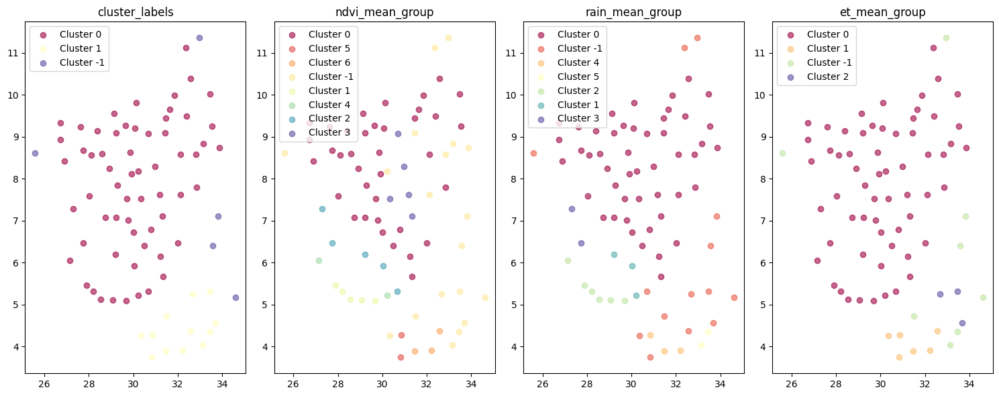

In [20]:
fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(15, 6))

clusters_cluster_labels = df_loc['cluster_labels'].unique()

# Assign a unique color to each cluster
colors_cluster_labels = plt.cm.Spectral(np.linspace(0, 1, len(clusters_cluster_labels)))
for cluster, color in zip(clusters_cluster_labels, colors_cluster_labels):
    subset = df_loc[df_loc['cluster_labels'] == cluster]
    ax1.scatter(subset['centx'], subset['centy'], c=[color], label=f"Cluster {cluster}", alpha=0.6)

# Get unique cluster labels for ndvi_mean_group
clusters_ndvi = df_loc['ndvi_mean_group'].unique()
# Assign a unique color to each cluster
colors_ndvi = plt.cm.Spectral(np.linspace(0, 1, len(clusters_ndvi)))
for cluster, color in zip(clusters_ndvi, colors_ndvi):
    subset = df_loc[df_loc['ndvi_mean_group'] == cluster]
    ax2.scatter(subset['centx'], subset['centy'], c=[color], label=f"Cluster {cluster}", alpha=0.6)

# Get unique cluster labels for rain_mean_group
clusters_rain = df_loc['rain_mean_group'].unique()
# Assign a unique color to each cluster
colors_ndvi = plt.cm.Spectral(np.linspace(0, 1, len(clusters_rain)))
for cluster, color in zip(clusters_rain, colors_ndvi):
    subset = df_loc[df_loc['rain_mean_group'] == cluster]
    ax3.scatter(subset['centx'], subset['centy'], c=[color], label=f"Cluster {cluster}", alpha=0.6)

# Get unique cluster labels for et_mean_group
clusters_et = df_loc['et_mean_group'].unique()
# Assign a unique color to each cluster
colors_ndvi = plt.cm.Spectral(np.linspace(0, 1, len(clusters_et)))
for cluster, color in zip(clusters_et, colors_ndvi):
    subset = df_loc[df_loc['et_mean_group'] == cluster]
    ax4.scatter(subset['centx'], subset['centy'], c=[color], label=f"Cluster {cluster}", alpha=0.6)

ax1.legend()
ax2.legend()
ax3.legend()
ax4.legend()
ax1.set_title('cluster_labels')
ax2.set_title('ndvi_mean_group')
ax3.set_title('rain_mean_group')
ax4.set_title('et_mean_group')
plt.tight_layout()
plt.show()

In [21]:
news_df = pd.read_csv("data/articles_summary_cleaned_standardized_filtered_category.csv")
news_df

,Unnamed: 0,summary,date,location_article,lat,lng,location_new,category
0,0,The article discusses the passing of the new C...,7/7/2011,Juba,4.859363,31.571250,Juba,not provided
1,1,The article discusses the military actions tak...,7/3/2011,Abyei,9.838551,28.486396,Yei,economics
2,2,The article discusses the signing of a Framewo...,6/30/2011,Southern Kordofan,11.036544,30.895824,Southern Kordofan,"conflict, humanitarian"
3,3,The article discusses the upcoming independenc...,7/4/2011,South Sudan,6.876992,31.306979,South Sudan,conflict
4,4,The article discusses the need for South Sudan...,7/2/2011,Juba,4.859363,31.571250,Juba,economics
...,...,...,...,...,...,...,...,...
18515,18515,The article discusses the successful delivery ...,4/26/2023,Maiwut Primary Health Care Centre,8.606200,33.924100,Maiwut,healthcare
18516,18516,The article discusses the bombing and forced e...,4/26/2023,Khartoum,15.500654,32.559899,Khartoum,conflict
18517,18517,The article discusses how Prime Minister Abiy ...,4/23/2023,Addis Ababa,8.980603,38.757761,Addis Ababa,humanitarian
18518,18518,The article discusses the collapse of a commer...,4/17/2023,Kampala International University,0.294360,32.603970,Kampala International University,natural disaster


In [22]:
news_df['category'].unique()

array(['not provided', 'economics', 'conflict, humanitarian', 'conflict',
       'refugees', 'education', 'agriculture', 'humanitarian', 'hunger',
       'natural disaster', 'religion', 'gender equality', 'security',
       'health', 'youth', 'crime', 'peace', 'corruption',
       'water scarcity', 'politics', 'healthcare', 'media',
       'peacekeeping', 'diplomacy', 'gender', 'human rights abuses',
       'climate change', 'human rights',
       'conflict, refugees, humanitarian', 'infrastructure',
       'freedom of press', 'women empowerment',
       'hunger, refugees, conflict, humanitarian',
       'conflict, refugees, humanitarian, hunger',
       'conflict, hunger, refugees, humanitarian', 'child labour',
       'arts and culture', 'conflict, refugees',
       'conflict, humanitarian, hunger', 'identity', 'gender inequality',
       'nutrition', 'gender-based violence', 'culture',
       'youth, governance', 'border', 'environment', 'child labor',
       'gender based violence'

In [23]:
ndvi_category = ['agriculture', 'environment', 'environmental'] #   
rain_category = ['water scarcity', 'water resources', 'water', 'natural disaster','climate change','environmental disaster'] # rainfall
et_category = ['water scarcity', 'water management', 'water', 'water, conflict','climate change','environmental disaster'] # evapotranspiration 
population_category = ['refugees','conflict, refugees, humanitarian','hunger, refugees, conflict, humanitarian', 'conflict, refugees, humanitarian, hunger','conflict, hunger, refugees, humanitarian','conflict, refugees','border','conflict, humanitarian, refugees','border dispute','border conflict','border issues']
food_price_category = ['economics','conflict','hunger','crime','corruption','hunger, refugees, conflict, humanitarian', 'conflict, refugees, humanitarian, hunger','conflict, hunger, refugees, humanitarian','conflict, humanitarian, hunger','conflict, hunger','conflict, hunger, refugees, humanitarian, agriculture','conflict, humanitarian, economics','conflict, poverty, corruption, humanitarian, hunger']

In [24]:
news_df = news_df[['summary', 'date', 'location_new', 'category']]
news_df[news_df['location_new'].str.contains(r'\bBor\b|\bBor\s', case=False, regex=True)]['location_new'].unique()

array(['Bor', 'Jonglei Bor civil hospital',
       'Jonglei Institute of Health and Science (JIHS) in Bor',
       "Jonglei state's Bor county", 'Jonglei state capital, Bor',
       'Jonglei state capital Bor', 'Jonglei state capital of Bor',
       'Jonglei State Capital Bor'], dtype=object)

In [25]:
# short example for demenstration
label = df_loc[df_loc['district']=='Bor']['ndvi_mean_group'][0]
grouped_locations = df_loc[df_loc['ndvi_mean_group']==label]['district'].unique()
grouped_df = pd.DataFrame()
for index, row in news_df[(news_df['category'].isin(ndvi_category))&(news_df['location_new'].str.contains(r'\bBor\b|\bBor\s', case=False, regex=True))].iterrows():  # assume 0 is weather
    tmp = pd.DataFrame([row] * len(grouped_locations))
    tmp['location_new'] = grouped_locations
    tmp['ndvi_mean_group'] = label
    grouped_df = pd.concat([grouped_df, tmp]) 
grouped_df 

,summary,date,location_new,category,ndvi_mean_group
3150,The article discusses the start of agricultura...,4/10/2012,Bor,agriculture,0
3150,The article discusses the start of agricultura...,4/10/2012,Jur River,agriculture,0
3150,The article discusses the start of agricultura...,4/10/2012,Aweil North,agriculture,0
3150,The article discusses the start of agricultura...,4/10/2012,Terekeka,agriculture,0
3150,The article discusses the start of agricultura...,4/10/2012,Awerial,agriculture,0
...,...,...,...,...,...
12321,The article discusses an outbreak of deadly di...,9/20/2014,Panyikang,agriculture,0
12321,The article discusses an outbreak of deadly di...,9/20/2014,Baliet,agriculture,0
12321,The article discusses an outbreak of deadly di...,9/20/2014,Fashoda,agriculture,0
12321,The article discusses an outbreak of deadly di...,9/20/2014,Melut,agriculture,0


In [26]:
Jason_grouped_df = pd.DataFrame()
for group, category in [('ndvi_mean_group',ndvi_category), ('rain_mean_group',rain_category), ('et_mean_group',et_category)]:
    for district in df_loc['district'].unique(): 
        label = df_loc.loc[df_loc['district'] == district, group].values[0] # find which label in which group does this district in df_loc belongs to
        if label != -1:
            grouped_locations = df_loc[df_loc[group]==label]['district'].unique() # find all districts that has same label and are in the same group as 'district'
            for index, row in news_df[(news_df['category'].isin(category))&(news_df['location_new'].str.contains(r'\b{}\b|\b{}\s'.format(district, district), case=False, regex=True))].iterrows():  # iterate through new_df and find desir category and the district we are looking at
                tmp = pd.DataFrame([row] * len(grouped_locations)) # Make duplication of the current row in news_df
                tmp['location_new'] = grouped_locations # Change the location_article value in duplicated rows to the locations in df_loc['district'].unique()
                Jason_grouped_df = pd.concat([Jason_grouped_df, tmp]) 
Jason_grouped_df

,summary,date,location_new,category
3150,The article discusses the start of agricultura...,4/10/2012,Bor,agriculture
3150,The article discusses the start of agricultura...,4/10/2012,Jur River,agriculture
3150,The article discusses the start of agricultura...,4/10/2012,Aweil North,agriculture
3150,The article discusses the start of agricultura...,4/10/2012,Terekeka,agriculture
3150,The article discusses the start of agricultura...,4/10/2012,Awerial,agriculture
...,...,...,...,...
18246,The article discusses how the UN refugee agenc...,10/19/2021,Panyikang,natural disaster
18246,The article discusses how the UN refugee agenc...,10/19/2021,Baliet,natural disaster
18246,The article discusses how the UN refugee agenc...,10/19/2021,Fashoda,natural disaster
18246,The article discusses how the UN refugee agenc...,10/19/2021,Melut,natural disaster


In [27]:
complete_group = pd.concat([Jason_grouped_df[['summary','date','location_new','category']], news_df[['summary','date','location_new','category']]]).drop_duplicates()
complete_group

,summary,date,location_new,category
3150,The article discusses the start of agricultura...,4/10/2012,Bor,agriculture
3150,The article discusses the start of agricultura...,4/10/2012,Jur River,agriculture
3150,The article discusses the start of agricultura...,4/10/2012,Aweil North,agriculture
3150,The article discusses the start of agricultura...,4/10/2012,Terekeka,agriculture
3150,The article discusses the start of agricultura...,4/10/2012,Awerial,agriculture
...,...,...,...,...
18515,The article discusses the successful delivery ...,4/26/2023,Maiwut,healthcare
18516,The article discusses the bombing and forced e...,4/26/2023,Khartoum,conflict
18517,The article discusses how Prime Minister Abiy ...,4/23/2023,Addis Ababa,humanitarian
18518,The article discusses the collapse of a commer...,4/17/2023,Kampala International University,natural disaster


In [28]:
geo_group = pd.read_csv("data/Xiaoya_group_results.csv")
geo_group = geo_group[(geo_group['Population_Group']!=-1) | (geo_group['Price_Group']!=-1)]
geo_group

,country,district_code,district,centx,centy,year_month,year,month,ipc,ha,...,food_price_idx,area,cropland_pct,pop,ruggedness_mean,pasture_pct,date,cluster_labels,Population_Group,Price_Group
0,South Sudan,136,Abiemnhom,29.13019,9.550939,2007_01,2007,1,2.0,NaN,...,0.600941,2408.233,1.742261,18973.21,11004.64,91.48276,2007-01-01,0,1,2
1,South Sudan,136,Abiemnhom,29.13019,9.550939,2007_02,2007,2,2.0,NaN,...,0.584477,2408.233,1.742261,18973.21,11004.64,91.48276,2007-02-01,0,1,2
2,South Sudan,136,Abiemnhom,29.13019,9.550939,2007_03,2007,3,2.0,NaN,...,0.597499,2408.233,1.742261,18973.21,11004.64,91.48276,2007-03-01,0,1,2
3,South Sudan,136,Abiemnhom,29.13019,9.550939,2007_04,2007,4,2.0,NaN,...,0.619426,2408.233,1.742261,18973.21,11004.64,91.48276,2007-04-01,0,1,2
4,South Sudan,136,Abiemnhom,29.13019,9.550939,2007_05,2007,5,2.0,NaN,...,0.645193,2408.233,1.742261,18973.21,11004.64,91.48276,2007-05-01,0,1,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12319,South Sudan,101,Yirol West,30.48698,6.395244,2019_10,2019,10,3.0,1.0,...,88.886650,4879.717,0.462767,154856.00,25073.43,87.71930,2019-10-01,0,2,3
12320,South Sudan,101,Yirol West,30.48698,6.395244,2019_11,2019,11,3.0,NaN,...,93.556460,4879.717,0.462767,154856.00,25073.43,87.71930,2019-11-01,0,2,3
12321,South Sudan,101,Yirol West,30.48698,6.395244,2019_12,2019,12,3.0,NaN,...,98.434210,4879.717,0.462767,154856.00,25073.43,87.71930,2019-12-01,0,2,3
12322,South Sudan,101,Yirol West,30.48698,6.395244,2020_01,2020,1,3.0,NaN,...,98.732880,4879.717,0.462767,111980.60,25073.43,87.71930,2020-01-01,0,2,3


In [29]:
news_df['date'] = pd.to_datetime(news_df['date'], format='%m/%d/%Y').dt.strftime('%Y_%m')
news_df

C:\Users\20210967\AppData\Local\Temp\ipykernel_14392\434138329.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  news_df['date'] = pd.to_datetime(news_df['date'], format='%m/%d/%Y').dt.strftime('%Y_%m')


,summary,date,location_new,category
0,The article discusses the passing of the new C...,2011_07,Juba,not provided
1,The article discusses the military actions tak...,2011_07,Yei,economics
2,The article discusses the signing of a Framewo...,2011_06,Southern Kordofan,"conflict, humanitarian"
3,The article discusses the upcoming independenc...,2011_07,South Sudan,conflict
4,The article discusses the need for South Sudan...,2011_07,Juba,economics
...,...,...,...,...
18515,The article discusses the successful delivery ...,2023_04,Maiwut,healthcare
18516,The article discusses the bombing and forced e...,2023_04,Khartoum,conflict
18517,The article discusses how Prime Minister Abiy ...,2023_04,Addis Ababa,humanitarian
18518,The article discusses the collapse of a commer...,2023_04,Kampala International University,natural disaster


In [30]:
grouped_df = pd.DataFrame()
for group, category in [('Population_Group',population_category), ('Price_Group',food_price_category)]:
    for year_month in geo_group['year_month'].unique():
        for district in geo_group[geo_group['year_month']==year_month]['district'].unique(): 
            label = geo_group[(geo_group['year_month']==year_month) & (geo_group['district']==district)][group].iloc[0]
            grouped_locations = geo_group[(geo_group['year_month']==year_month) & (geo_group[group]==label)]['district'].unique()
            for index, row in news_df[(news_df['date']==year_month)&(news_df['category'].isin(category))&(news_df['location_new'].str.contains(r'\b{}\b|\b{}\s'.format(district, district), case=False, regex=True))].iterrows():
                tmp = pd.DataFrame([row] * len(grouped_locations))
                tmp['location_new'] = grouped_locations
                grouped_df = pd.concat([grouped_df, tmp])
                print(grouped_df)
grouped_df

                                               summary     date  \
307  The article discusses how South Sudan has barr...  2011_07   
307  The article discusses how South Sudan has barr...  2011_07   
307  The article discusses how South Sudan has barr...  2011_07   
307  The article discusses how South Sudan has barr...  2011_07   
307  The article discusses how South Sudan has barr...  2011_07   
307  The article discusses how South Sudan has barr...  2011_07   
307  The article discusses how South Sudan has barr...  2011_07   
307  The article discusses how South Sudan has barr...  2011_07   
307  The article discusses how South Sudan has barr...  2011_07   
307  The article discusses how South Sudan has barr...  2011_07   
307  The article discusses how South Sudan has barr...  2011_07   
307  The article discusses how South Sudan has barr...  2011_07   
307  The article discusses how South Sudan has barr...  2011_07   
307  The article discusses how South Sudan has barr...  2011_0

,summary,date,location_new,category
307,The article discusses how South Sudan has barr...,2011_07,Akobo,refugees
307,The article discusses how South Sudan has barr...,2011_07,Aweil East,refugees
307,The article discusses how South Sudan has barr...,2011_07,Aweil West,refugees
307,The article discusses how South Sudan has barr...,2011_07,Ayod,refugees
307,The article discusses how South Sudan has barr...,2011_07,Bor,refugees
...,...,...,...,...
17350,The article discusses South African Deputy Pre...,2020_02,Lainya,conflict
17350,The article discusses South African Deputy Pre...,2020_02,Yei,conflict
17361,The article discusses the joint security manag...,2020_02,Juba,conflict
17361,The article discusses the joint security manag...,2020_02,Lainya,conflict


In [31]:
complete_group = pd.concat([grouped_df[['summary','date','location_new','category']], complete_group]).drop_duplicates()
complete_group

,summary,date,location_new,category
307,The article discusses how South Sudan has barr...,2011_07,Akobo,refugees
307,The article discusses how South Sudan has barr...,2011_07,Aweil East,refugees
307,The article discusses how South Sudan has barr...,2011_07,Aweil West,refugees
307,The article discusses how South Sudan has barr...,2011_07,Ayod,refugees
307,The article discusses how South Sudan has barr...,2011_07,Bor,refugees
...,...,...,...,...
18515,The article discusses the successful delivery ...,4/26/2023,Maiwut,healthcare
18516,The article discusses the bombing and forced e...,4/26/2023,Khartoum,conflict
18517,The article discusses how Prime Minister Abiy ...,4/23/2023,Addis Ababa,humanitarian
18518,The article discusses the collapse of a commer...,4/17/2023,Kampala International University,natural disaster


In [ ]:
complete_group.to_csv('data/grouped_articles_summary.csv', index=False)